# Busqueda de palabras sobre PDF's en un directorio

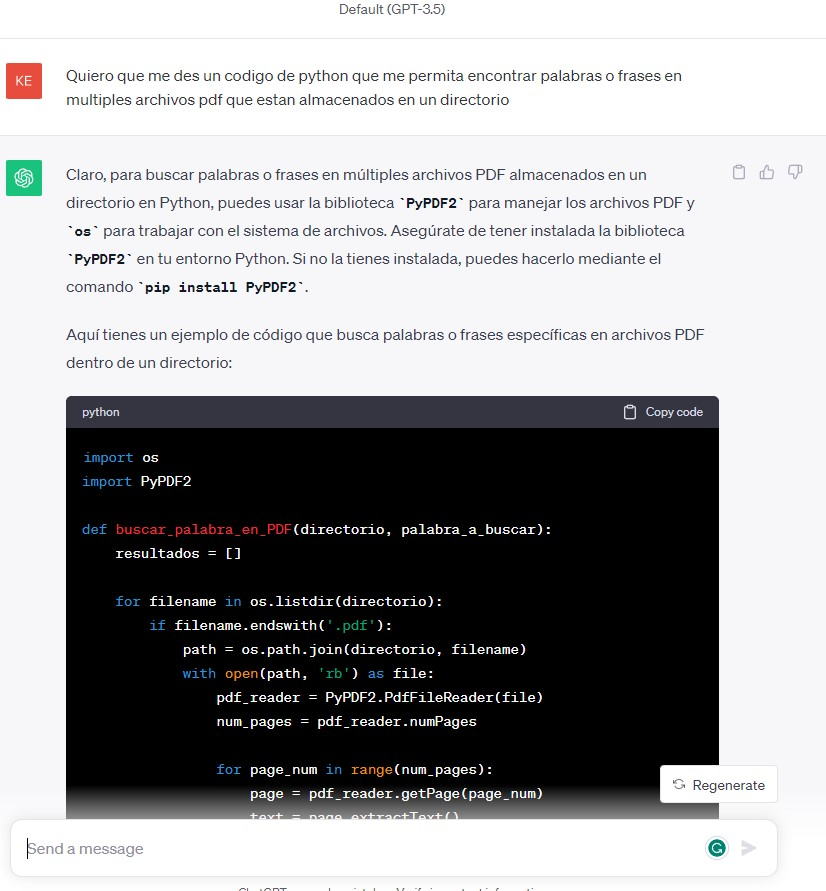

In [ ]:
pip install PyPDF2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.6/232.6 kB 4.0 MB/s eta 0:00:00


In [ ]:
pip install pdfreader

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 29.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 286.5/286.5 kB 20.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 76.3 MB/s eta 0:00:00
  Created wheel for pdfreader: filename=pdfreader-0.1.12-py3-none-any.whl size=134539 sha256=2968b504096b90e52c303c7b8f20c82398fa7c18abf3e1196db9f51bf2a55c5d
  Stored in directory: /root/.cache/pip/wheels/92/7d/f1/8b8a503d8b444a82e4c3c8b1230c02316c7579b90542de4495
Successfully built pdfreader


In [ ]:
import os
import PyPDF2

def buscar_palabra_en_PDF(directorio, palabra_a_buscar):
    resultados = []

    for filename in os.listdir(directorio):
        if filename.endswith('.pdf'):
            path = os.path.join(directorio, filename)
            with open(path, 'rb') as file:
                pdf_reader = PyPDF2.PdfReader(file)
                #num_pages = pdf_reader.numPages
                num_pages = len(pdf_reader.pages)

                for page_num in range(num_pages):
                    page = pdf_reader.pages[page_num]
                    text = page.extract_text()

                    if palabra_a_buscar in text:
                        resultados.append(f"Se encontró '{palabra_a_buscar}' en el archivo: {filename}, página: {page_num + 1}")

    return (resultados)


In [ ]:
# Directorio donde se encuentran los archivos PDF
directorio_pdf = '/content/'

# Palabra o frase a buscar en los archivos PDF
palabra = 'Ingeniero'

resultados_busqueda = buscar_palabra_en_PDF(directorio_pdf, palabra)

if resultados_busqueda:
    for resultado in resultados_busqueda:
        print(resultado)
else:
    print(f"No se encontró '{palabra}' en los archivos PDF del directorio: {directorio_pdf}")

Se encontró 'Ingeniero' en el archivo: CV Daniel_Eduardo_Ortiz_2021 V5 -.pdf, página: 1
Se encontró 'Ingeniero' en el archivo: CV Kevin Orjuela.pdf, página: 1
Se encontró 'Ingeniero' en el archivo: CV Kevin Orjuela.pdf, página: 2


# Creacion de preguntas sobre PDF's

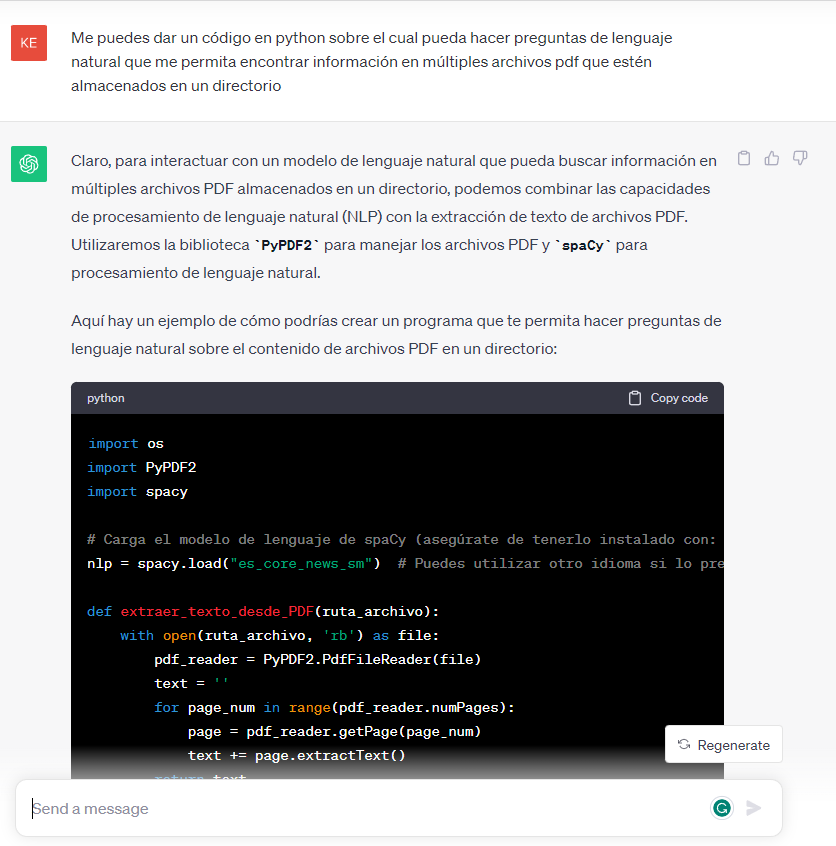

In [ ]:
pip install spacy

In [ ]:
!python -m spacy download es_core_news_md

2023-11-01 00:29:32.986075: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-01 00:29:32.986154: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-01 00:29:32.986205: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-01 00:29:34.593595: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 MB 21.6 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('es_core_news_md')


In [ ]:
import os
import PyPDF2
import spacy
from spacy.lang.es.examples import sentences
import en_core_web_sm

In [ ]:
# Carga el modelo de lenguaje de spaCy (asegúrate de tenerlo instalado con: pip install spacy)
nlp = spacy.load("es_core_news_md")  # Puedes utilizar otro idioma si lo prefieres
#nlp = en_core_web_sm.load()

In [ ]:
def extraer_texto_desde_PDF(ruta_archivo):
    with open(ruta_archivo, 'rb') as file:
        pdf_reader = PyPDF2.PdfReader(file)
        pages = len(pdf_reader.pages)
        text = ''

        for page_num in range(pages):
            page = pdf_reader.pages[page_num]
            text += page.extract_text()
        return text

In [ ]:
def buscar_informacion_en_PDFs(directorio, pregunta):
    resultados = []

    for filename in os.listdir(directorio):
        if filename.endswith('.pdf'):
            path = os.path.join(directorio, filename)
            texto = extraer_texto_desde_PDF(path)

            # Procesa la pregunta usando spaCy
            doc = nlp(texto)
            pregunta_procesada = nlp(pregunta)

            # Encuentra similitud entre la pregunta y el texto del documento
            similitud = pregunta_procesada.similarity(doc)

            # Establece un umbral de similitud para encontrar la respuesta
            umbral_similitud = 0.7  # Puedes ajustar este valor según tu necesidad

            if similitud > umbral_similitud:
                resultados.append(f"Respuesta encontrada en '{filename}':\n")
                resultados.append(f"Texto: {texto}\n")

    return resultados

In [ ]:
# Directorio donde se encuentran los archivos PDF
directorio_pdf = '/content/'

# Pregunta de lenguaje natural
pregunta_usuario = "¿Existe alguien de nacionalidad Colombiana?"

resultados_busqueda = buscar_informacion_en_PDFs(directorio_pdf, pregunta_usuario)

if resultados_busqueda:
    for resultado in resultados_busqueda:
        print(resultado)
else:
    print(f"No se encontró respuesta para la pregunta en los archivos PDF del directorio: {directorio_pdf}")

<ipython-input-47-af740644b1ac>:14: UserWarning: [W007] The model you're using has no word vectors loaded, so the result of the Doc.similarity method will be based on the tagger, parser and NER, which may not give useful similarity judgements. This may happen if you're using one of the small models, e.g. `en_core_web_sm`, which don't ship with word vectors and only use context-sensitive tensors. You can always add your own word vectors, or use one of the larger models instead if available.
  similitud = pregunta_procesada.similarity(doc)


Respuesta encontrada en 'CV Daniel_Eduardo_Ortiz_2021 V5 -.pdf':

Texto: Ingeniero Industrial de la universidad Nacional de Colombia con  
conocimientos en el área administrativa y operacional relacionado 
con: desarro de proyectos, analisis de factores laborales , 
transformación y automatización de datos  en Power BI , Data Studio 
y Tableau, conocimiento en la  implementación de SGSST y analisis 
de ergonómico de puestos detrabajo . 
 
Experiencia en el desarrolo de actividades por proyectos , mejora de 
los  procesos transversales,  caracterizado por trabajo en equipo  y  
solución de problemas orientados a calidad y mejora continua, mi 
trabajo se caractriza por ser  pulcro  y honesto en el desarrollo de 
activi dades  que sean solicitadas . 
Manuel Arturo Montenegro (Tío)  
Cargo:  Subgerente sucursal Cedritos.  
Empresa:  BBVA  
Teléfono:  310 779 1934  Bogotá D. C 
CC. 1 .010.214.316 
Tel: 402 6888  
Krr 5  No - 12 -72 sur  
Cel: 311 231 5640  
elgemelortiz@gmail.com  
deortizm

In [ ]:
# Directorio donde se encuentran los archivos PDF
directorio_pdf = '/content/'

# Pregunta de lenguaje natural
pregunta_usuario = "¿Existe alguien con maestria?"

resultados_busqueda = buscar_informacion_en_PDFs(directorio_pdf, pregunta_usuario)

if resultados_busqueda:
    for resultado in resultados_busqueda:
        print(resultado)
else:
    print(f"No se encontró respuesta para la pregunta en los archivos PDF del directorio: {directorio_pdf}")

No se encontró respuesta para la pregunta en los archivos PDF del directorio: /content/


# Segundo ejemplo busqueda por medio de preguntas

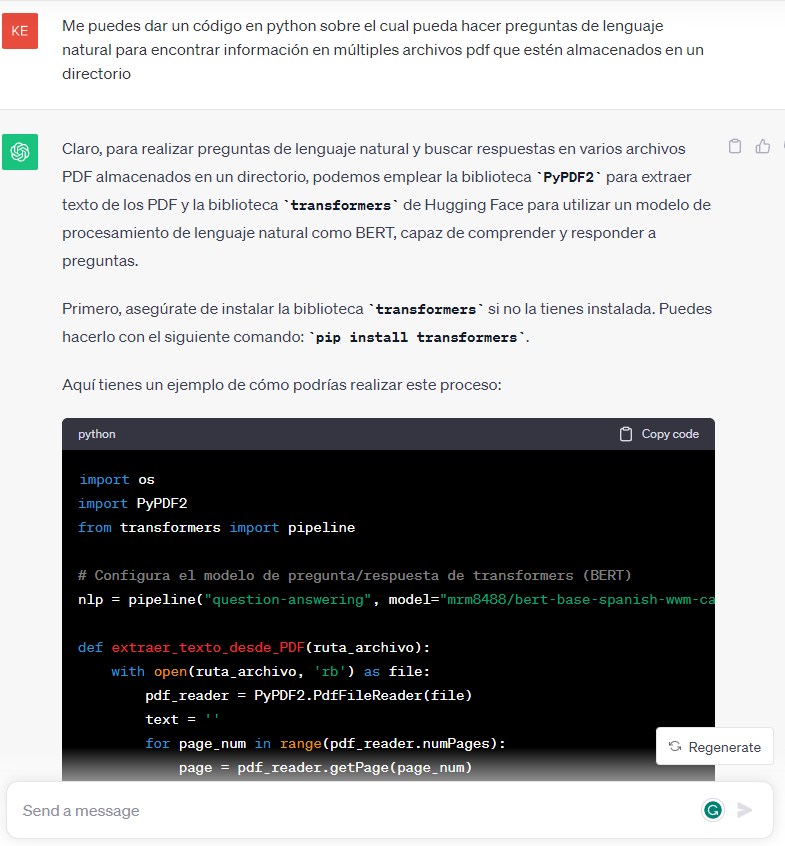

In [ ]:
pip install transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 42.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.0/302.0 kB 24.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 93.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 75.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 29.6 MB/s eta 0:00:00


In [ ]:
import os
import PyPDF2
from transformers import pipeline

In [ ]:
nlp = pipeline("question-answering", model="mrm8488/bert-base-spanish-wwm-cased-finetuned-spa-squad2-es")

Some weights of the model checkpoint at mrm8488/bert-base-spanish-wwm-cased-finetuned-spa-squad2-es were not used when initializing BertForQuestionAnswering: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForQuestionAnswering from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForQuestionAnswering from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
def extraer_texto_desde_PDF(ruta_archivo):
    with open(ruta_archivo, 'rb') as file:
        pdf_reader = PyPDF2.PdfReader(file)
        text = ''
        for page_num in range(len(pdf_reader.pages)):
            page = pdf_reader.pages[page_num]
            text += page.extract_text()
        return text

In [ ]:
def buscar_respuesta_en_PDFs(directorio, pregunta):
    resultados = []

    for filename in os.listdir(directorio):
        if filename.endswith('.pdf'):
          print(filename)
          path = os.path.join(directorio, filename)
          texto = extraer_texto_desde_PDF(path)

          # Realiza la búsqueda de la respuesta en el texto del PDF
          answer = nlp({'question': pregunta, 'context': texto})

          # Si se encuentra una respuesta, agrega los resultados
          # Puedes ajustar este valor según tu necesidad
          if answer['score'] > 0.1:
            resultados.append(f"Respuesta encontrada en '{filename}':")
            resultados.append(f"Pregunta: {pregunta}")
            resultados.append(f"Respuesta: {answer['answer']}\n")

    return resultados

In [ ]:
# Directorio donde se encuentran los archivos PDF
directorio_pdf = '/content/'

# Pregunta de lenguaje natural
pregunta_usuario = "¿Existe alguien de nacionalidad Colombiana?"

resultados_busqueda = buscar_respuesta_en_PDFs(directorio_pdf, pregunta_usuario)

if resultados_busqueda:
    for resultado in resultados_busqueda:
        print(resultado)
else:
    print(f"No se encontró respuesta para la pregunta en los archivos PDF del directorio: {directorio_pdf}")

Respuesta encontrada en 'CV Kevin Orjuela.pdf':
Pregunta: ¿Existe alguien de nacionalidad Colombiana?
Respuesta: Nielsen



In [ ]:
# Directorio donde se encuentran los archivos PDF
directorio_pdf = '/content/'

# Pregunta de lenguaje natural
pregunta_usuario = "¿Existe algún Ingeniero Industrial?"

resultados_busqueda = buscar_respuesta_en_PDFs(directorio_pdf, pregunta_usuario)

if resultados_busqueda:
    for resultado in resultados_busqueda:
        print(resultado)
else:
    print(f"No se encontró respuesta para la pregunta en los archivos PDF del directorio: {directorio_pdf}")

Respuesta encontrada en 'CV Daniel_Eduardo_Ortiz_2021.pdf':
Pregunta: ¿Existe algún Ingeniero Industrial?
Respuesta: universidad Nacional de Colombia



In [ ]:
# Directorio donde se encuentran los archivos PDF
directorio_pdf = '/content/'

# Pregunta de lenguaje natural
pregunta_usuario = "¿Existe algún profesional comunicador social?"

resultados_busqueda = buscar_respuesta_en_PDFs(directorio_pdf, pregunta_usuario)

if resultados_busqueda:
    for resultado in resultados_busqueda:
        print(resultado)
else:
    print(f"No se encontró respuesta para la pregunta en los archivos PDF del directorio: {directorio_pdf}")

CV Daniel_Eduardo_Ortiz_2021.pdf
CV Kevin Orjuela.pdf
CV Laura Orjuela Camargo.pdf
hoja de vida 2022 V2.pdf
Respuesta encontrada en 'CV Kevin Orjuela.pdf':
Pregunta: ¿Existe algún profesional comunicador social?
Respuesta: Laura Orjuela Camargo

Respuesta encontrada en 'CV Laura Orjuela Camargo.pdf':
Pregunta: ¿Existe algún profesional comunicador social?
Respuesta: Periodista



In [ ]:
resultados_busqueda

["Respuesta encontrada en 'CV Kevin Orjuela.pdf':",
 'Pregunta: ¿Existe algún profesional comunicador social?',
 'Respuesta: Laura Orjuela Camargo\n',
 "Respuesta encontrada en 'CV Laura Orjuela Camargo.pdf':",
 'Pregunta: ¿Existe algún profesional comunicador social?',
 'Respuesta: Periodista\n']

# Creacion de interfaz de prueba para aplicar funciones

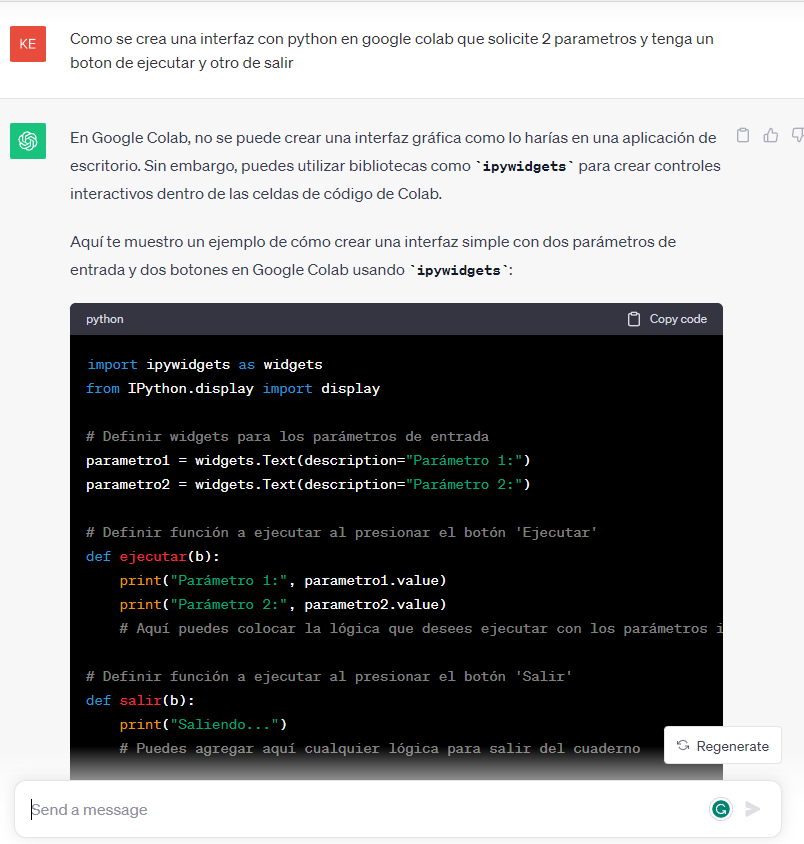

In [ ]:
import ipywidgets as widgets
from IPython.display import display

# Definir widgets para los parámetros de entrada
parametro1 = widgets.Text(description="Directorio")
parametro2 = widgets.Text(description="Pregunta")

# Definir función a ejecutar al presionar el botón 'Ejecutar'
def ejecutar(b):
    print("Parámetro 1:", parametro1.value)
    print("Parámetro 2:", parametro2.value)
    # Aquí puedes colocar la lógica que desees ejecutar con los parámetros ingresados

# Definir función a ejecutar al presionar el botón 'Salir'
def salir(b):
    print("Saliendo...")
    # Puedes agregar aquí cualquier lógica para salir del cuaderno

# Crear botones
boton_ejecutar = widgets.Button(description="Ejecutar")
boton_salir = widgets.Button(description="Salir")

In [ ]:
# Asignar la función a ejecutar al botón 'Ejecutar'
boton_ejecutar.on_click(ejecutar)

# Asignar la función a ejecutar al botón 'Salir'
boton_salir.on_click(salir)

# Mostrar los widgets y botones
display(parametro1, parametro2, boton_ejecutar, boton_salir)

Text(value='', description='Directorio')

Text(value='', description='Pregunta')

Button(description='Ejecutar', style=ButtonStyle())

Button(description='Salir', style=ButtonStyle())

Parámetro 1: /content/
Parámetro 2: ¿Hay algún ingeniero industrial?
Saliendo...


# Interfaz para ejecución busqueda sobre PDFs

In [18]:
!pip install transformers
!pip install PyPDF2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.6/232.6 kB 4.4 MB/s eta 0:00:00


In [19]:
import os
import PyPDF2
from transformers import pipeline

In [20]:
nlp = pipeline("question-answering", model="mrm8488/bert-base-spanish-wwm-cased-finetuned-spa-squad2-es")

Some weights of the model checkpoint at mrm8488/bert-base-spanish-wwm-cased-finetuned-spa-squad2-es were not used when initializing BertForQuestionAnswering: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
- This IS expected if you are initializing BertForQuestionAnswering from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForQuestionAnswering from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [21]:
def extraer_texto_desde_PDF(ruta_archivo):
    with open(ruta_archivo, 'rb') as file:
        pdf_reader = PyPDF2.PdfReader(file)
        text = ''
        for page_num in range(len(pdf_reader.pages)):
            page = pdf_reader.pages[page_num]
            text += page.extract_text()
        return text

In [62]:
def buscar_respuesta_en_PDFs(directorio, pregunta):
    resultados = []

    for filename in os.listdir(directorio):
        if filename.endswith('.pdf'):
          print('Procesando...', filename)
          path = os.path.join(directorio, filename)
          texto = extraer_texto_desde_PDF(path)

          # Realiza la búsqueda de la respuesta en el texto del PDF
          answer = nlp({'question': pregunta, 'context': texto})

          # Si se encuentra una respuesta, agrega los resultados
          # Puedes ajustar este valor según tu necesidad
          if answer['score'] > 0.1:
            resultados.append(f"Respuesta encontrada en '{filename}':")
            resultados.append(f"Pregunta: {pregunta}")
            resultados.append(f"Respuesta: {answer['answer']}\n")

            texto_cv = texto[answer['start']-27:answer['end']+20]

    return (resultados, texto_cv)

In [33]:
#Bases del ejemplo
# Directorio donde se encuentran los archivos PDF
directorio = '/content/'
filename = 'CV Kevin Orjuela.pdf'
path = os.path.join(directorio, filename)

#Pruebas
texto = extraer_texto_desde_PDF(path)
# Pregunta de lenguaje natural
pregunta = "¿Existe alguien de nacionalidad Colombiana?"
# Realiza la búsqueda de la respuesta en el texto del PDF
answer = nlp({'question': pregunta, 'context': texto})



In [65]:
import ipywidgets as widgets
from IPython.display import display

# Definir widgets para los parámetros de entrada
parametro1 = widgets.Text(description="Directorio")
parametro2 = widgets.Text(description="Pregunta")

# Definir función a ejecutar al presionar el botón 'Ejecutar'
def ejecutar(b):
    print("Parámetro 1:", parametro1.value)
    print("Parámetro 2:", parametro2.value)

    # Aquí puedes colocar la lógica que desees ejecutar con los parámetros ingresados
    resultados_busqueda, contexto = buscar_respuesta_en_PDFs(parametro1.value, parametro2.value)
    if resultados_busqueda:
      for resultado in resultados_busqueda:
        print(resultado)

    else:
      print(f"No se encontró respuesta para la pregunta en los archivos PDF del directorio: {directorio_pdf}")
    print("Contexto:...\n", contexto)
# Definir función a ejecutar al presionar el botón 'Salir'
def salir(b):
    print("Saliendo...")
    # Puedes agregar aquí cualquier lógica para salir del cuaderno

# Crear botones
boton_ejecutar = widgets.Button(description="Ejecutar")
boton_salir = widgets.Button(description="Salir")

In [66]:
# Asignar la función a ejecutar al botón 'Ejecutar'
boton_ejecutar.on_click(ejecutar)

# Asignar la función a ejecutar al botón 'Salir'
boton_salir.on_click(salir)

# Mostrar los widgets y botones
display(parametro1, parametro2, boton_ejecutar, boton_salir)

Text(value='', description='Directorio')

Text(value='', description='Pregunta')

Button(description='Ejecutar', style=ButtonStyle())

Button(description='Salir', style=ButtonStyle())

Parámetro 1: /content/
Parámetro 2: ¿Existe algun ingeniero industrial?
Procesando... CV Kevin Orjuela.pdf
Procesando... CV Laura Orjuela Camargo.pdf
Procesando... CV Daniel_Eduardo_Ortiz_2021 V5 -.pdf
Procesando... hoja de vida 2022 V2.pdf
Respuesta encontrada en 'CV Daniel_Eduardo_Ortiz_2021 V5 -.pdf':
Pregunta: ¿Existe algun ingeniero industrial?
Respuesta: universidad Nacional de Colombia

Contexto:...
 geniero Industrial de la universidad Nacional de Colombia con  
conocimientos


# Audio a Texto

In [ ]:
import speech_recognition as sr

def transcribir_audio(ruta_audio):
    # Inicializar el reconocedor
    recognizer = sr.Recognizer()

    # Cargar el archivo de audio
    with sr.AudioFile(ruta_audio) as audio_file:
        # Escuchar el audio
        audio = recognizer.record(audio_file)

        try:
            # Utilizar Google Speech Recognition para convertir el audio a texto
            texto = recognizer.recognize_google(audio, language="es-ES")  # Puedes cambiar el idioma si es necesario
            return texto
        except sr.UnknownValueError:
            return "No se pudo entender el audio"
        except sr.RequestError:
            return "Error en la solicitud"

# Ruta del archivo de audio (cambia 'ruta/a/tu/audio.wav' por la ruta de tu archivo de audio)
ruta_audio = 'ruta/a/tu/audio.wav'

# Llamar a la función para transcribir el audio a texto
texto_transcrito = transcribir_audio(ruta_audio)

print("Texto transcrito:")
print(texto_transcrito)

# Reconocimiento de Objetos en imágenes

In [2]:
!pip install transformers
!pip install torch
!pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 50.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.0/302.0 kB 28.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 82.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 72.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 29.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 21.3 MB/s eta 0:00:00


In [3]:
from transformers import DetrImageProcessor, DetrForObjectDetection
import torch
from PIL import Image
import requests
import cv2

url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image = Image.open(requests.get(url, stream=True).raw)

In [7]:
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50")



inputs = processor(images=image, return_tensors="pt")
outputs = model(**inputs)

# convert outputs (bounding boxes and class logits) to COCO API
# let's only keep detections with score > 0.9
target_sizes = torch.tensor([image.size[::-1]])
results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=0.9)[0]

The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [8]:
from matplotlib import pyplot as plt
from matplotlib.patches import Rectangle

Detected remote with confidence 0.998 at location [40.16, 70.81, 175.55, 117.98]
Detected remote with confidence 0.996 at location [333.24, 72.55, 368.33, 187.66]
Detected couch with confidence 0.995 at location [-0.02, 1.15, 639.73, 473.76]
Detected cat with confidence 0.999 at location [13.24, 52.05, 314.02, 470.93]
Detected cat with confidence 0.999 at location [345.4, 23.85, 640.37, 368.72]


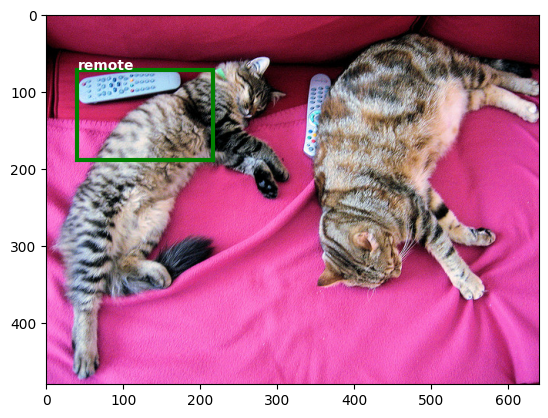

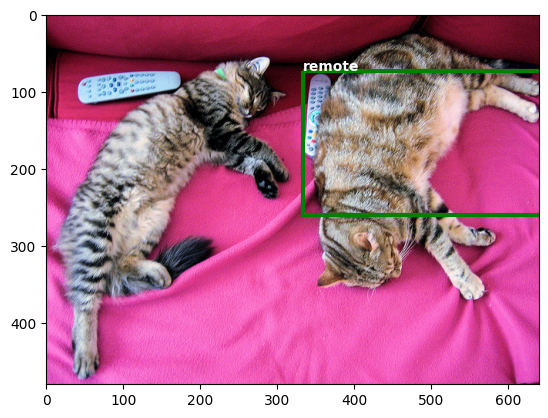

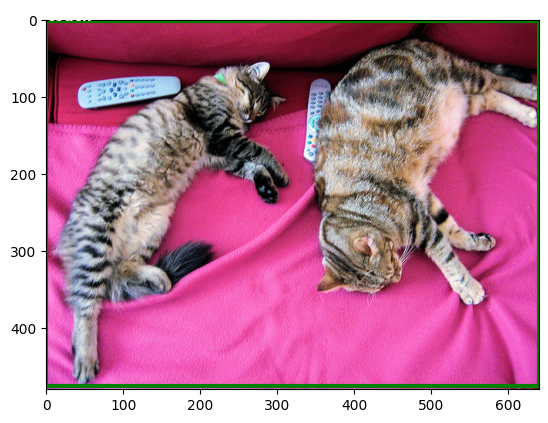

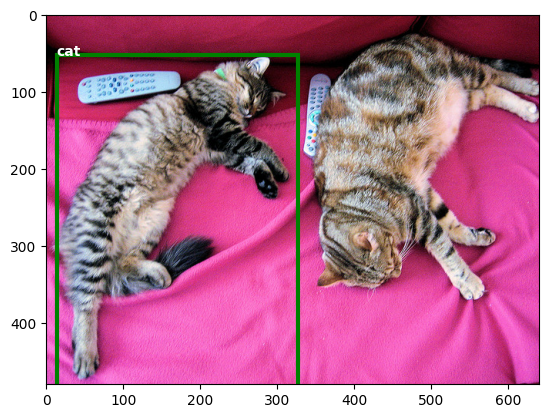

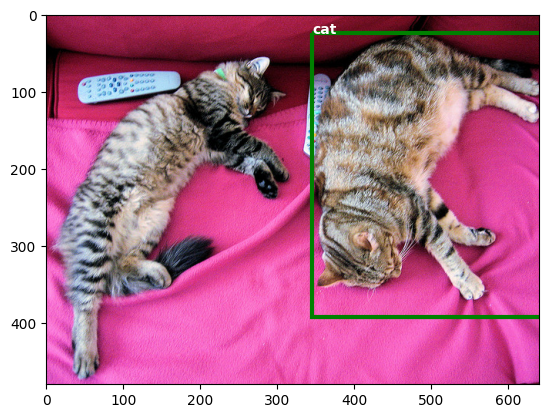

In [9]:
for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]

    fig, ax = plt.subplots()
    plt.imshow(image)
    ax.add_patch(Rectangle((box[0],box[1]),box[2],box[3], edgecolor='green',fill=False, lw=3))
    ax.annotate(f"{model.config.id2label[label.item()]}",(box[0],box[1]),color='white',weight='bold')

    print(
            f"Detected {model.config.id2label[label.item()]} with confidence "
            f"{round(score.item(), 3)} at location {box}"
    )
plt.show(image)

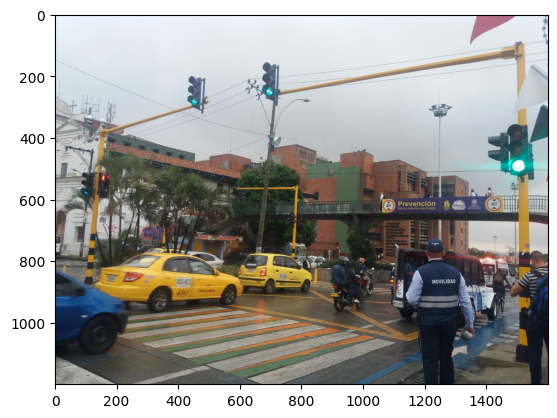

In [11]:
url = "https://cloudfront-us-east-1.images.arcpublishing.com/semana/IB5VGQPRNVF7XNMBYMT5DOKVRQ.jpg"
image = Image.open(requests.get(url, stream=True).raw)
plt.imshow(image)

In [12]:
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50")

inputs = processor(images=image, return_tensors="pt")
outputs = model(**inputs)

# convert outputs (bounding boxes and class logits) to COCO API
# let's only keep detections with score > 0.9
target_sizes = torch.tensor([image.size[::-1]])
results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=0.9)[0]

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Detected traffic light with confidence 0.996 at location [670.31, 158.0, 719.11, 273.51]
Detected person with confidence 0.996 at location [891.14, 789.7, 985.36, 949.86]
Detected motorcycle with confidence 0.987 at location [897.06, 868.26, 977.14, 968.26]
Detected traffic light with confidence 0.996 at location [1468.26, 353.96, 1546.59, 525.96]
Detected person with confidence 0.997 at location [1472.47, 774.02, 1599.97, 1198.69]
Detected person with confidence 0.99 at location [1418.84, 834.04, 1468.69, 965.28]
Detected car with confidence 0.998 at location [592.36, 779.97, 838.03, 908.47]
Detected motorcycle with confidence 0.984 at location [985.77, 839.81, 1037.9, 914.68]
Detected car with confidence 0.977 at location [797.18, 785.47, 884.19, 823.47]
Detected traffic light with confidence 0.997 at location [424.56, 196.32, 473.2, 301.22]
Detected car with confidence 0.998 at location [134.14, 774.97, 605.68, 967.96]
Detected traffic light with confidence 0.961 at location [1421.7

<ipython-input-13-baef890f06d2>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


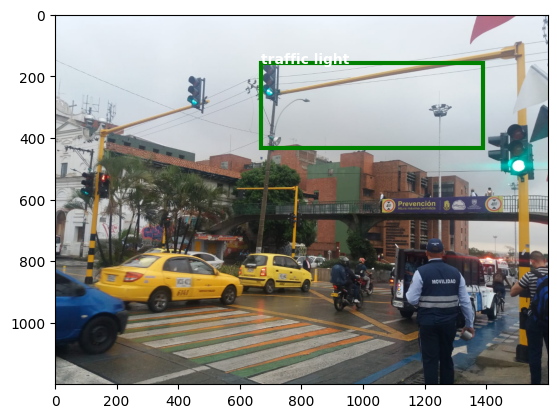

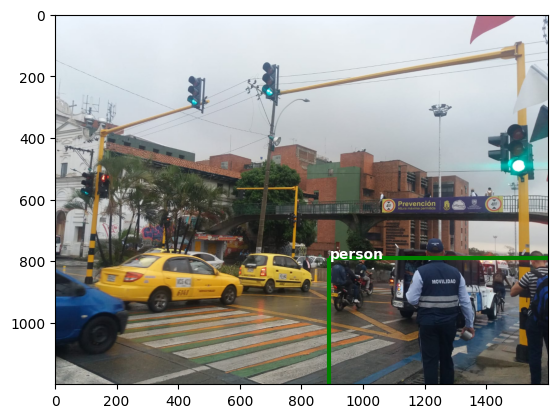

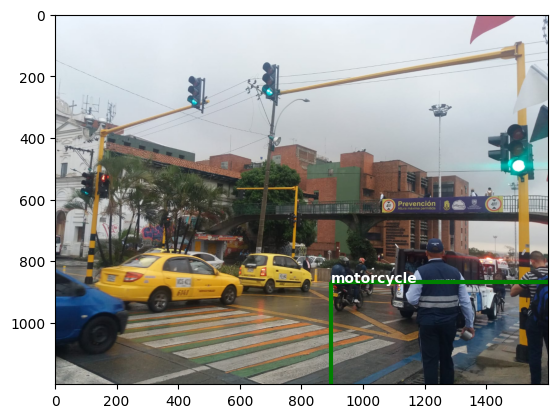

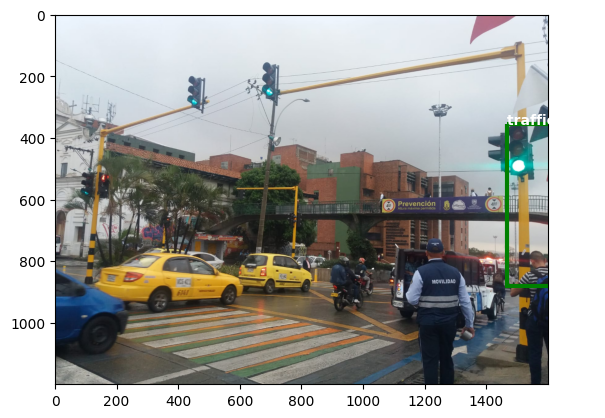

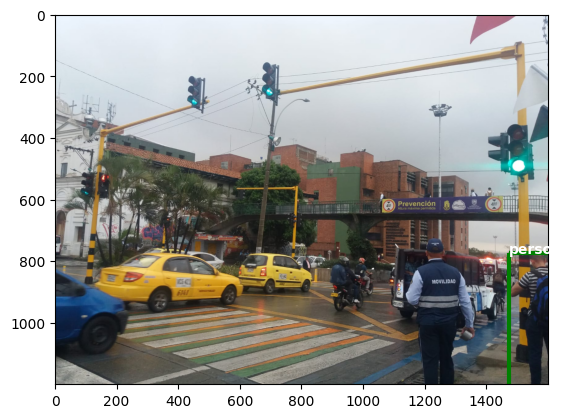

...

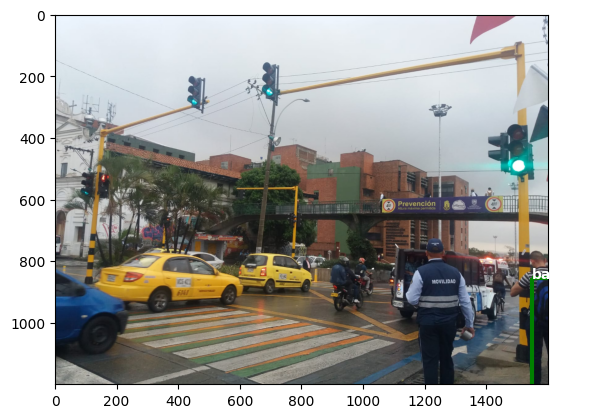

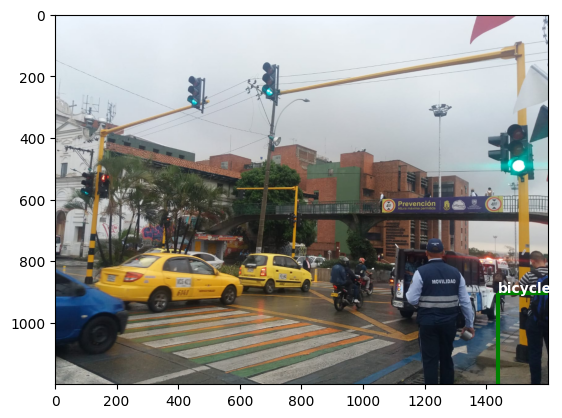

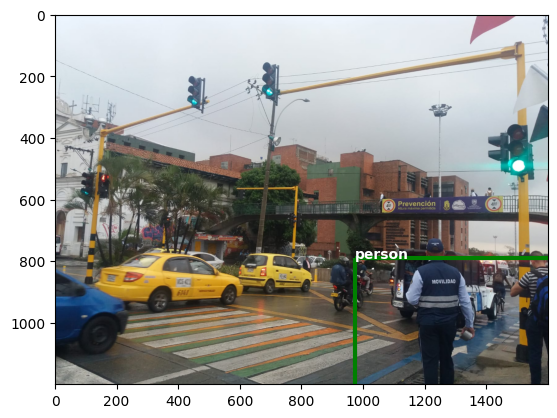

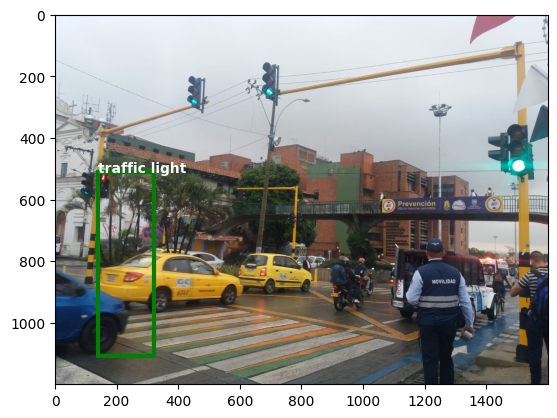

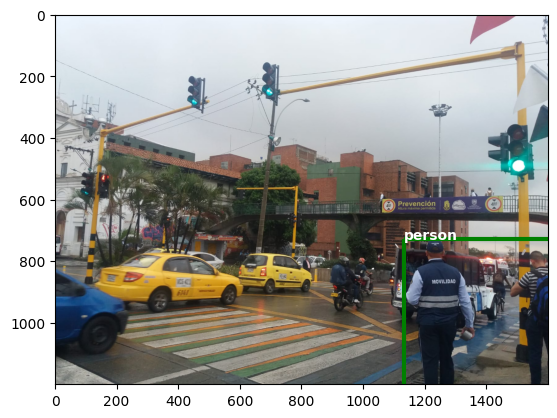

In [13]:
for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]

    fig, ax = plt.subplots()
    plt.imshow(image)
    ax.add_patch(Rectangle((box[0],box[1]),box[2],box[3], edgecolor='green',fill=False, lw=3))
    ax.annotate(f"{model.config.id2label[label.item()]}",(box[0],box[1]),color='white',weight='bold')

    print(
            f"Detected {model.config.id2label[label.item()]} with confidence "
            f"{round(score.item(), 3)} at location {box}"
    )
plt.show()

# Detección en video

In [14]:
# Importar paquetes
import pandas as pd
import cv2
from matplotlib import pyplot as plt

In [ ]:
#Video almacenado
video_path = '/content/Trafico.mp4'
cap = cv2.VideoCapture(video_path)

output_w = 300
output_h = 300

#Object detection from stable camera
object_detector = cv2.createBackgroundSubtractorMOG2(history=100, varThreshold=30)

while cap.isOpened():
    #Leer el fotograma del flujo del video
    ret, frame = cap.read()
    #height, width, _ = frame.shape
    #Imprimir el tamaño del video // Solo para pruebas
    #print(height, width)

    if not ret:
        break
    #Determinar el area de analisis de la deteccion de objetos
    roi = frame[350:720,400:1200]


    #Crear mask para object detection
    mask = object_detector.apply(roi) # Inicialmente se aplicaba sobre "frame", pero se cambia para hacer mas optima la deteccion
    #limpieza de la mascara
    _, mask = cv2.threshold(mask, 254, 255, cv2.THRESH_OTSU)
    #_, mask = cv2.adaptiveThreshold(mask, 255, cv2.ADAPTIVE_THRESH_MEAN_C)

    contornos, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    for cnt in contornos:
        #Calcular el area de los objetos y remover elementos pequeños
        area = cv2.contourArea(cnt)
        if area > 700:
            #cv2.drawContours(frame, [cnt], -1, (0,255,0), 2) // Ejemplo inicial teniendo en cuenta toda la imagen
            #cv2.drawContours(roi, [cnt], -1, (0,255,0), 2)  #Pintar los contornos
            #Dibujar la caja que contiene al objeto
            x, y, w, h = cv2.boundingRect(cnt)
            cv2.rectangle(roi, (x,y), (x+w,y+h), color=(0,255,0), thickness=3)

    #Muestra el fotograma redimensionado
    cv2.imshow('Video Procesado', frame)
    #Muestra la mascara creada
    #cv2.imshow('Mascara', mask)
    #Mostrar el roi
    #cv2.imshow('ROI', roi)

    #logica de deteccion de objetos


    #Salida de la aplicacion
    if cv2.waitKey(25) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()